C:\Users\h4z3m\AppData\Local\Temp\ipykernel_7936\4189971840.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=[15, 15])


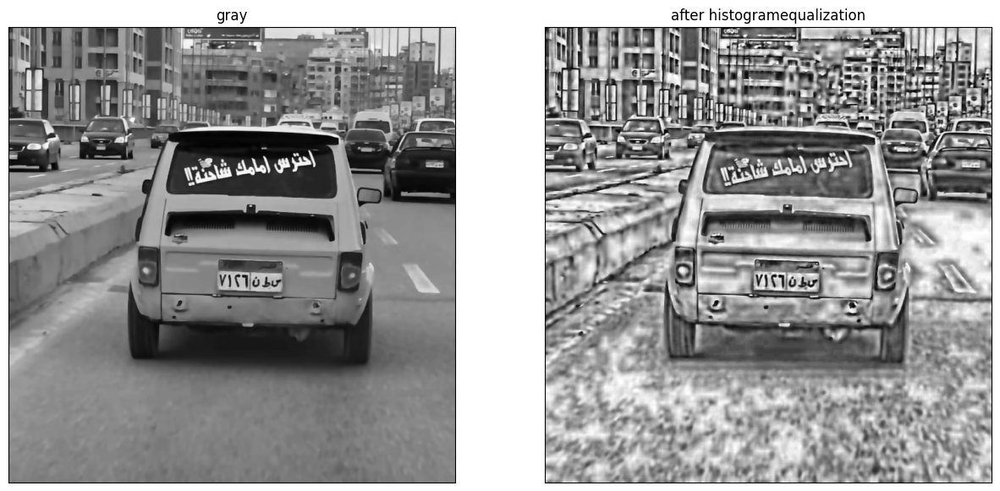

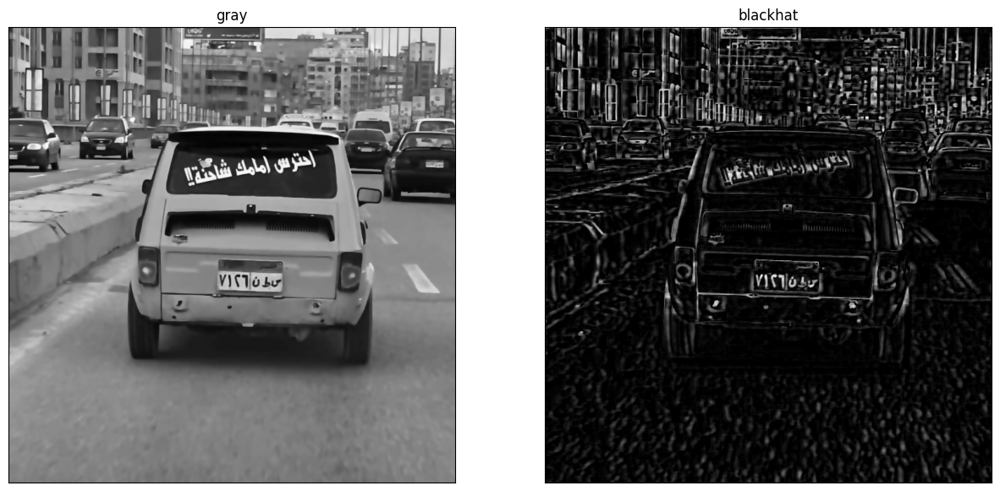

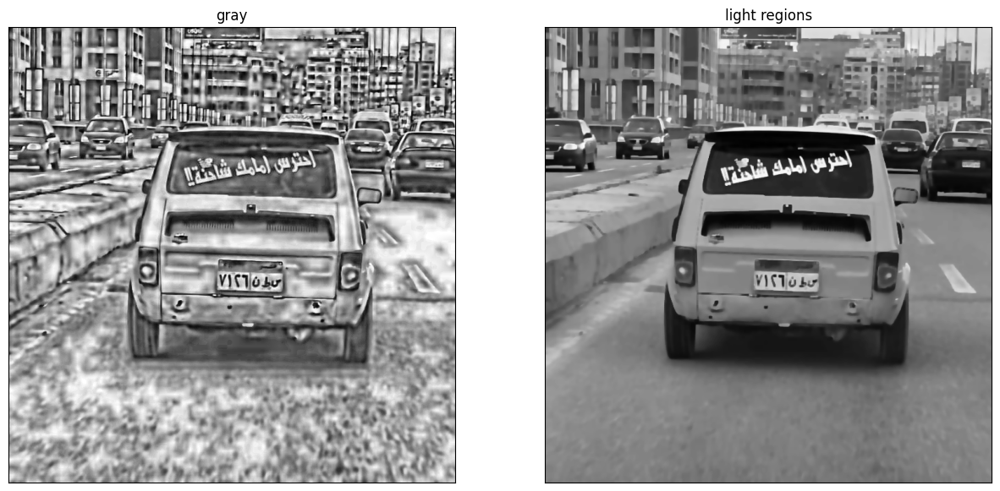

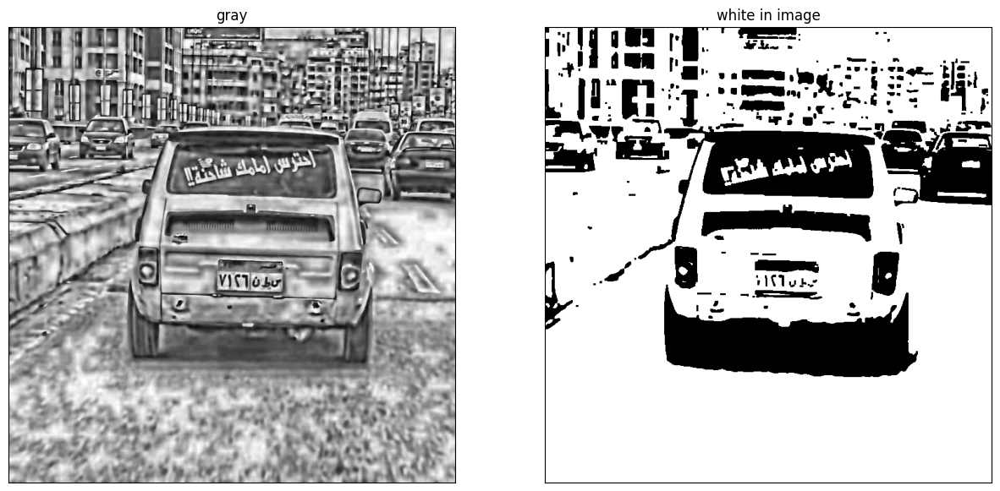

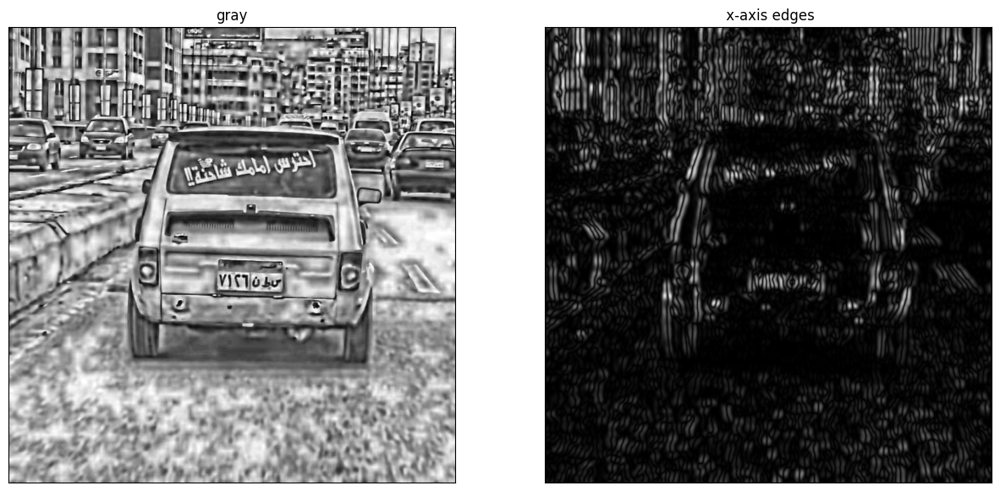

...

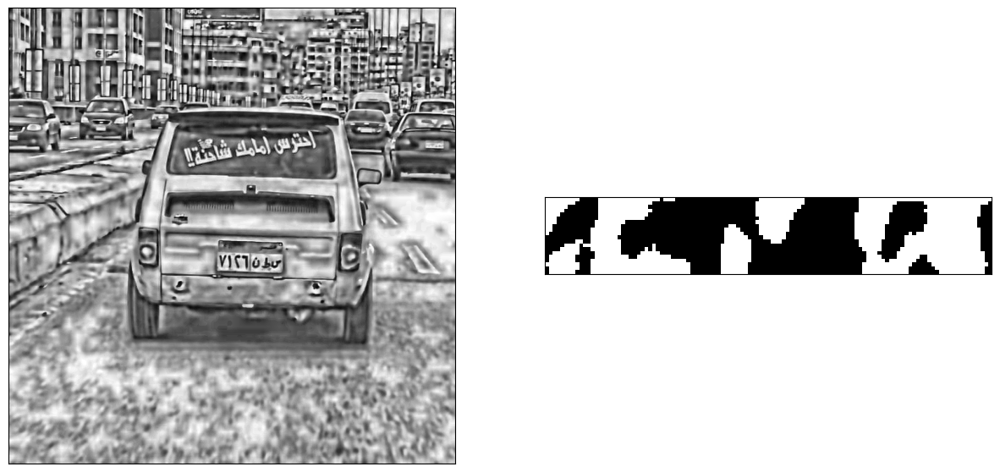

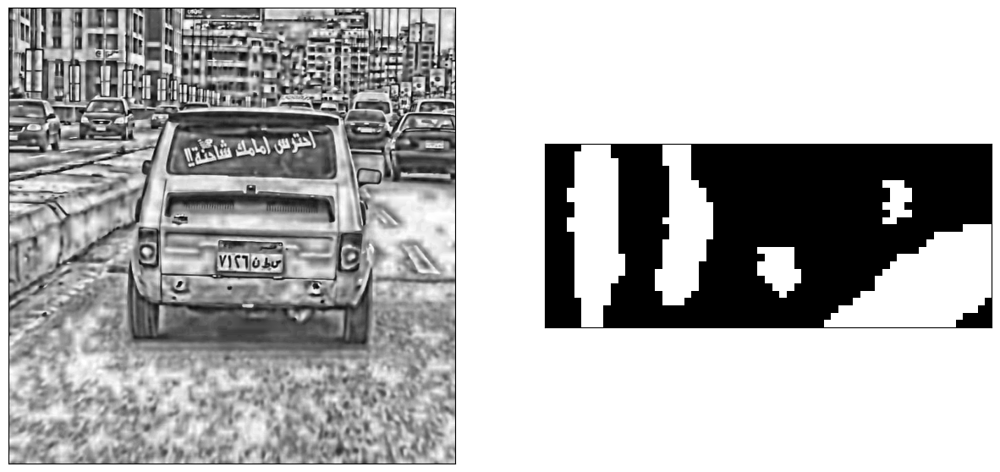

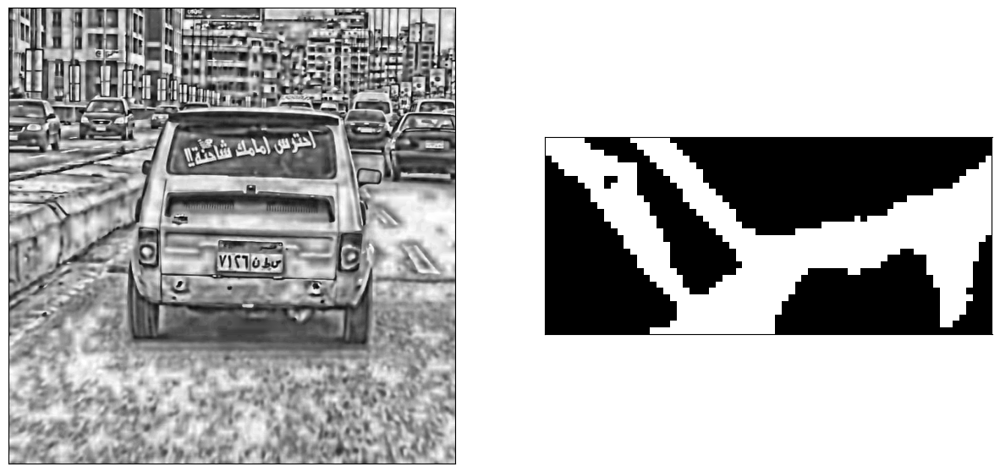

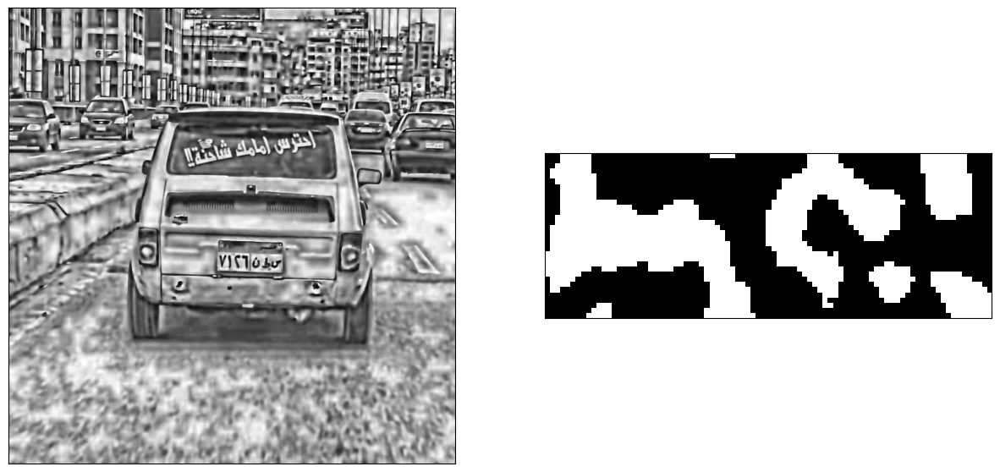

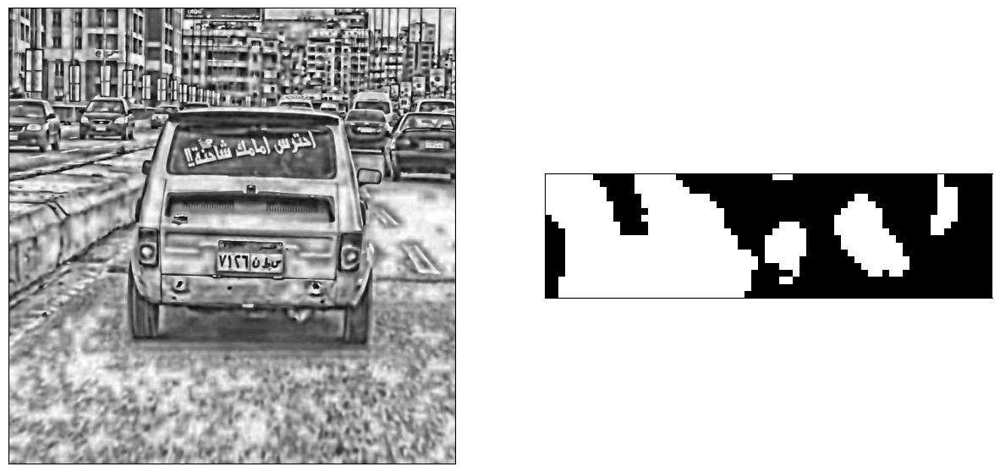

In [2]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import imutils
import sys

sys.path.append("..")
minAR = 1.7
maxAR = 6.1
minArea = 300
maxArea = 29000


def plot_images(img1, img2, title1="", title2=""):
    fig = plt.figure(figsize=[15, 15])
    ax1 = fig.add_subplot(121)
    ax1.imshow(img1, cmap="gray")
    ax1.set(xticks=[], yticks=[], title=title1)

    ax2 = fig.add_subplot(122)
    ax2.imshow(img2, cmap="gray")
    ax2.set(xticks=[], yticks=[], title=title2)
    pass


def draw_contours(thresholded, image):
    # Find contours
    contours, _ = cv2.findContours(
        thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    # Draw all contours on the original image
    image_contours = cv2.drawContours(image.copy(), contours, -1, (0, 255, 0), 3)
    return image_contours


def normalize_edges(edges):
    edges = edges.copy()
    edges = np.absolute(edges)
    (minVal, maxVal) = (np.min(edges), np.max(edges))
    edges = 255 * ((edges - minVal) / (maxVal - minVal))
    edges = edges.astype("uint8")
    return edges


reference_object = cv2.imread("image_1.png")
reference_gray = cv2.cvtColor(reference_object, cv2.COLOR_BGR2GRAY)
reference_gray = cv2.resize(reference_gray, (128, 128))
hog = cv2.HOGDescriptor()
reference_features = hog.compute(reference_gray)
# for i in [*range(1, 101),*range(500,601)]:
for i in range(1, 2):
    filename = "../../data/Vehicles/{:04d}.jpg".format(i)

    image = cv2.imread(filename)
    image = cv2.bilateralFilter(image, d=9, sigmaColor=80, sigmaSpace=80)

    gray_1 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    clahe = cv2.createCLAHE(clipLimit=10, tileGridSize=(60, 60))
    gray = clahe.apply(gray_1)
    _, binary_image = cv2.threshold(gray, 20, 255, cv2.THRESH_BINARY_INV)
    # Invert the image so that letters are black and background is white
    result_image = cv2.bitwise_or(gray, binary_image)

    plot_images(gray_1, gray, "gray", "after histogramequalization")

    radius = 16
    disk_kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE, (2 * radius + 1, 2 * radius + 1), (radius, radius)
    )
    opened_image = cv2.morphologyEx(gray, cv2.MORPH_OPEN, disk_kernel)
    # gray = cv2.subtract(gray, opened_image)

    """ perform a blackhat morphological operation to reveal dark characters (letters, digits, and symbols)
     against light backgrounds (the license plate itself)"""
    rectKern = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (12, 6))
    blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, rectKern)
    plot_images(gray_1, blackhat, "gray", "blackhat")

    """ find regions in the image that are light and may contain license plate characters
    find regions in the image that are light and may contain license plate characters """
    squareKern = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    light = cv2.morphologyEx(gray_1, cv2.MORPH_CLOSE, squareKern)
    plot_images(gray, light, "gray", "light regions")
    light = cv2.threshold(light, 0, 255, cv2.THRESH_OTSU + cv2.THRESH_BINARY)[1]
    plot_images(gray, light, "gray", "white in image")

    """ detect edges in the image and emphasize the boundaries of
    the characters in the license plate"""
    gradX = cv2.Sobel(blackhat, cv2.CV_32F, 1, 0, ksize=31)
    gradX = normalize_edges(gradX)
    plot_images(gray, gradX, "gray", " x-axis edges")

    """smooth to group the regions that may contain boundaries to license plate characters"""
    gradXX = cv2.bitwise_and(gradX, light, mask=light)
    # plot_images(gradXX,gradX,"masked x-axis"," x-axis edges")
    gradX = cv2.GaussianBlur(gradX, (9, 9), 2)

    gradX = cv2.morphologyEx(
        gradXX, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_RECT, (23, 6))
    )
    plot_images(gray, gradX, "gray", "edges closging")

    thresh = cv2.threshold(gradX, 40, 255, cv2.THRESH_BINARY)[1]

    plot_images(gray, thresh, "gray", "thresholded")

    """ there are many other large white regions as well
        perform a series of erosions and dilations in an attempt to denoise
    """
    # thresh = cv2.erode(thresh, cv2.getStructuringElement(cv2.MORPH_RECT, (8, 5)), iterations=2)
    # thresh = cv2.dilate(thresh,cv2.getStructuringElement(cv2.MORPH_DILATE, (7, 6)), iterations=2)
    thresh = cv2.morphologyEx(
        thresh, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (15, 5))
    )
    plot_images(gray, thresh, "gray", "thresholded after erode dilate and masking")

    """
    light image serves as our mask for a bitwise-AND between the thresholded result and
    the light regions of the image to reveal the license plate candidates.
    follow with a couple of dilations and an erosion
    to fill holes and clean up the image
     """
    thresh = cv2.bitwise_and(thresh, thresh, mask=light)
    plot_images(gray, thresh, "gray", "thresholded after erode dilate and masking")

    # thresh = cv2.dilate(thresh,cv2.getStructuringElement(cv2.MORPH_DILATE, (7, 6)), iterations=1)
    # thresh = cv2.erode(thresh,cv2.getStructuringElement(cv2.MORPH_RECT, (8, 5)), iterations=1)
    thresh = cv2.morphologyEx(
        thresh, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_RECT, (18, 5))
    )

    plot_images(gray, thresh, "gray", "After anding with light and closing")

    """
     show me all contours
    """
    all_Contours = draw_contours(thresh.copy(), image.copy())
    plot_images(image, all_Contours, "image", "all contours")

    """
    find more relative contour

    """
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    cnts = sorted(cnts, key=cv2.contourArea, reverse=True)[:20]

    lpCnt = None
    roi = None
    images_set = []

    for c in cnts:
        area = cv2.contourArea(c)
        (x, y, w, h) = cv2.boundingRect(c)
        area_ratio = area / (w * h)
        ar = w / float(h)
        if (
            (minAR <= ar <= maxAR)
            and (14 <= h)
            and (minArea <= w * h <= maxArea)
            and (55 < w)
        ):  ## case 2 2le 5ltne 23ml width kda
            lpCnt = c
            licensePlate = result_image[y : y + h, x : x + w]
            roi = cv2.threshold(
                licensePlate, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU
            )[1]
            _, binary_mask = cv2.threshold(licensePlate, 165, 255, cv2.THRESH_BINARY)
            white_pixel_percentage = (
                np.count_nonzero(binary_mask == 255) / binary_mask.size
            )
            images_set.append(
                (image[y : y + h, x : x + w], area_ratio, white_pixel_percentage)
            )
            plot_images(gray, roi)

    distances = []
    for img, _, _ in images_set:
        # Convert image to grayscale
        image_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        image_gray = cv2.resize(image_gray, (128, 128))

        # Compute HOG features for the current image
        image_features = hog.compute(image_gray)

        # Calculate Euclidean distance (you can use other distance metrics as well)
        distance = np.linalg.norm(reference_features - image_features)
        distances.append(distance)

    nearest_indices = np.argsort(distances)[:2]
    nearest_images = [images_set[i] for i in nearest_indices]

    if len(nearest_images) >= 2:
        # plot_images(
        #     image, nearest_images[0][0], nearest_images[0][1], nearest_images[0][2]
        # )
        # plot_images(
        #     image, nearest_images[1][0], nearest_images[1][1], nearest_images[1][2]
        # )
        cv2.imwrite(
            "../../data/Testing_output/{:04d}[00].jpg".format(i), nearest_images[0][0]
        )
        cv2.imwrite(
            "../../data/Testing_output/{:04d}[10].jpg".format(i), nearest_images[1][0]
        )
    else:
        # plot_images(
        #     image, nearest_images[0][0], nearest_images[0][1], nearest_images[0][2]
        # )
        if len(nearest_images) == 1:
            cv2.imwrite(
                "../../data/Testing_output/{:04d}[00].jpg".format(i),
                nearest_images[0][0],
            )
    ##roi=clear_border(roi)
    ##plot_images(image,roi)

In [ ]:
passed_800_900 =[
    "C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0805[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0810[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0815[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0820[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0822[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0823[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0824[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0825[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0829[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0832[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0835[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0837[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0838[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0839[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0840[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0842[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0843[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0844[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0845[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0846[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0847[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0849[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0851[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0853[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0854[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0855[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0856[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0857[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0858[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0859[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0860[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0861[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0862[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0864[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0865[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0866[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0867[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0869[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0870[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0874[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0875[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0876[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0877[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0878[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0879[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0882[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0891[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0892[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0893[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0894[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0895[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0896[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0897[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0898[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0898[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\\\0899[00].jpg",
]


import os

for file in passed_800_900:
    # move file to passed folder
    # check if exists
    if os.path.exists(
        os.path.join(
            "C://Users//h4z3m//Desktop//Files//College//4th//1st Semester//CMPS446//Project//repo//data//Testing_output",
            os.path.basename(file),
        )
    ):
        os.rename(
            file,
            os.path.join(
                "C://Users//h4z3m//Desktop//Files//College//4th//1st Semester//CMPS446//Project//repo//data//Testing_output//passed_800_900",
                os.path.basename(file),
            ),
        )

In [ ]:
passed = [
    "C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0001[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0002[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0003[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0004[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0005[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0005[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0006[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0007[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0008[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0010[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0011[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0012[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0013[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0014[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0015[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0016[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0017[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0018[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0019[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0019[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0020[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0021[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0021[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0025[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0025[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0026[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0027[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0028[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0028[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0032[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0035[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0037[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0039[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0040[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0041[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0042[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0043[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0044[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0046[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0047[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0048[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0049[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0051[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0052[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0053[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0054[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0055[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0057[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0058[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0060[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0061[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0062[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0064[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0065[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0066[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0069[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0071[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0073[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0073[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0074[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0076[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0078[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0079[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0081[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0082[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0083[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0084[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0085[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0086[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0087[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0088[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0092[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0095[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0097[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0098[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0099[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0500[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0501[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0502[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0503[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0504[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0505[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0506[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0507[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0508[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0509[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0510[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0511[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0513[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0514[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0515[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0517[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0518[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0518[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0519[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0521[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0522[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0523[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0524[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0525[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0527[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0528[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0529[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0533[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0534[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0535[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0536[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0537[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0538[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0539[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0540[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0542[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0544[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0545[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0546[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0547[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0548[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0550[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0552[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0555[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0557[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0558[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0559[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0564[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0565[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0565[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0566[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0567[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0568[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0569[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0571[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0573[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0575[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0576[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0577[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0578[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0579[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0580[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0582[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0583[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0585[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0587[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0588[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0591[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0593[00].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0597[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0598[10].jpg",
"C:\\Users\\h4z3m\\Desktop\\Files\\College\\4th\\1st Semester\\CMPS446\\Project\\repo\\data\\Testing_output\\0599[00].jpg"
]
import os

for file in passed:
    # move file to passed folder
    # check if exists
    if os.path.exists(
        os.path.join(
            "C://Users//h4z3m//Desktop//Files//College//4th//1st Semester//CMPS446//Project//repo//data//Testing_output",
            os.path.basename(file),
        )
    ):
        os.rename(
            file,
            os.path.join(
                "C://Users//h4z3m//Desktop//Files//College//4th//1st Semester//CMPS446//Project//repo//data//Testing_output//passed",
                os.path.basename(file),
            ),
        )

""" selection algorithm start with 0.6 area ratio not found any thing  decrease area ratio by 1.5  then for case 1 or case select one with most white   """

"""   try square  kern """